In [188]:
import numpy as np
import pandas as pd
import plotly as ptl
from sklearn import preprocessing
import seaborn as sns
from apiathena import apirequest
# Modelado
# ==============================================================================
from sklearn.neural_network import MLPRegressor
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.compose import make_column_selector
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import KFold
from sklearn import set_config
import multiprocessing

# Configuración warnings
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')

In [189]:
#Data_cleansing/csv_export_1/dim_country.csv

df_energyCo2 = pd.read_csv('../Data_cleansing/csv_export_1/energyco2.csv')
df_production = pd.read_csv('../Data_cleansing/csv_export_1/energy_consumption.csv')
df_country = pd.read_csv('../Data_cleansing/csv_export_1/country_info.csv')
df_co2_completo = pd.read_csv('../Datasets/energyco2.csv')


In [1]:
df_co2_completo

NameError: name 'df_co2_completo' is not defined

In [ ]:
le = preprocessing.LabelEncoder()
#Energy(dim)
df_energyCo2['Country_num'] = le.fit_transform(df_energyCo2['Country_Code'])
Country_NUM_Code = pd.DataFrame(le.classes_)
Country_NUM_Code.reset_index(inplace=True)

In [236]:
#df_co2_completo.head(50)
mask_AET = df_co2_completo['Energy_type']!='all_energy_types'
df_co2_AET = df_co2_completo[mask_AET]
mask_world = df_co2_AET['Country'] != 'World'
df_co2_final = df_co2_AET[mask_world]

In [237]:
df_co2_final.describe()

,Unnamed: 0,Year,Energy_consumption,Energy_production,GDP,Population,Energy_intensity_per_capita,Energy_intensity_by_GDP,CO2_emission
count,46000.000000,46000.000000,35494.000000,3.549600e+04,33155.000000,3.814500e+04,41765.000000,41765.000000,43043.000000
mean,27723.000000,1999.500000,0.479890,4.780944e-01,413.235917,3.126726e+04,71.909197,3.680257,23.622816
std,16004.280184,11.543522,2.708002,2.638127e+00,1449.011334,1.230778e+05,114.000315,4.595101,193.206585
min,7.000000,1980.000000,-0.163438,-1.000000e-39,0.124958,1.147100e+01,0.000000,0.000000,-0.005130
25%,13865.000000,1989.750000,0.000000,0.000000e+00,9.647490,1.120020e+03,3.739487,0.880636,0.000000
50%,27723.000000,1999.500000,0.008789,0.000000e+00,46.842800,6.062460e+03,29.425526,2.972417,0.000000
75%,41581.000000,2009.250000,0.137919,5.927255e-02,254.398100,1.964405e+04,95.916542,4.927267,1.671912
max,55439.000000,2019.000000,96.118714,8.851309e+01,23128.340000,1.434512e+06,1139.320598,166.913605,9113.558191


In [ ]:
df_energyCo2.drop(['Country_Code'],axis=1,inplace=True)

In [240]:
import plotly.express as px


fig = px.imshow(df_co2_final, text_auto=True,aspect= 'auto')
fig.show()

In [239]:
df_co2_final.fillna(0,inplace=True)

In [241]:
df_energyCo2_corr = df_co2_final.corr()

<AxesSubplot:>

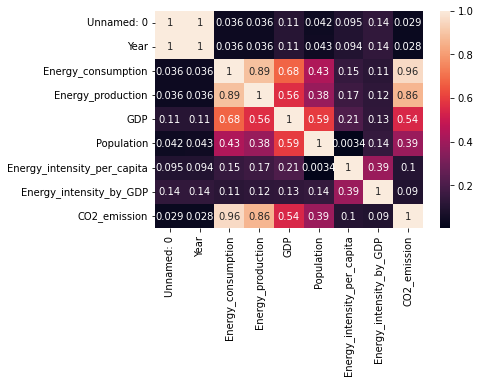

In [242]:
#import numpy as np 
#from pandas import DataFrame

%matplotlib inline

#Index= ['aaa', 'bbb', 'ccc', 'ddd', 'eee']
#Cols = ['A', 'B', 'C', 'D']
#df = DataFrame(abs(np.random.randn(5, 4)), index=Index, columns=Cols)

sns.heatmap(df_energyCo2_corr, annot=True)

In [ ]:
import plotly.graph_objects as go

fig = go.Figure(data=go.Heatmap(df_energyCo2_corr))
fig.show()

In [ ]:
import plotly.express as px


fig = px.imshow(df_energyCo2_corr, text_auto=True,aspect= 'auto')
fig.show()

In [243]:
df_co2_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 46000 entries, 7 to 55439
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Unnamed: 0                   46000 non-null  int64  
 1   Country                      46000 non-null  object 
 2   Energy_type                  46000 non-null  object 
 3   Year                         46000 non-null  int64  
 4   Energy_consumption           46000 non-null  float64
 5   Energy_production            46000 non-null  float64
 6   GDP                          46000 non-null  float64
 7   Population                   46000 non-null  float64
 8   Energy_intensity_per_capita  46000 non-null  float64
 9   Energy_intensity_by_GDP      46000 non-null  float64
 10  CO2_emission                 46000 non-null  float64
dtypes: float64(7), int64(2), object(2)
memory usage: 4.2+ MB


In [ ]:
from cgitb import reset

#, ['Energy_type']
df_co2_final.drop(['Unnamed: 0'], axis=1, inplace=True)
df_co2_final.drop(['Energy_type'], axis=1, inplace=True)


In [244]:
df_co2_final.rename(columns={"Unnamed: 0": 'Index'},inplace=True)

In [245]:
df_co2_final.describe()

,Index,Year,Energy_consumption,Energy_production,GDP,Population,Energy_intensity_per_capita,Energy_intensity_by_GDP,CO2_emission
count,46000.000000,46000.000000,46000.000000,4.600000e+04,46000.000000,4.600000e+04,46000.000000,46000.000000,46000.000000
mean,27723.000000,1999.500000,0.370287,3.689226e-01,297.844279,2.592804e+04,65.288861,3.341433,22.104279
std,16004.280184,11.543522,2.387251,2.326096e+00,1244.062160,1.126935e+05,110.597483,4.505901,186.983175
min,7.000000,1980.000000,-0.163438,-1.000000e-39,0.000000,0.000000e+00,0.000000,0.000000,-0.005130
25%,13865.000000,1989.750000,0.000000,0.000000e+00,0.000000,1.582005e+02,1.752021,0.000000,0.000000
50%,27723.000000,1999.500000,0.000305,0.000000e+00,15.203150,3.766955e+03,20.426788,2.617170,0.000000
75%,41581.000000,2009.250000,0.064137,1.723560e-02,126.805400,1.493192e+04,85.299028,4.658337,1.100000
max,55439.000000,2019.000000,96.118714,8.851309e+01,23128.340000,1.434512e+06,1139.320598,166.913605,9113.558191


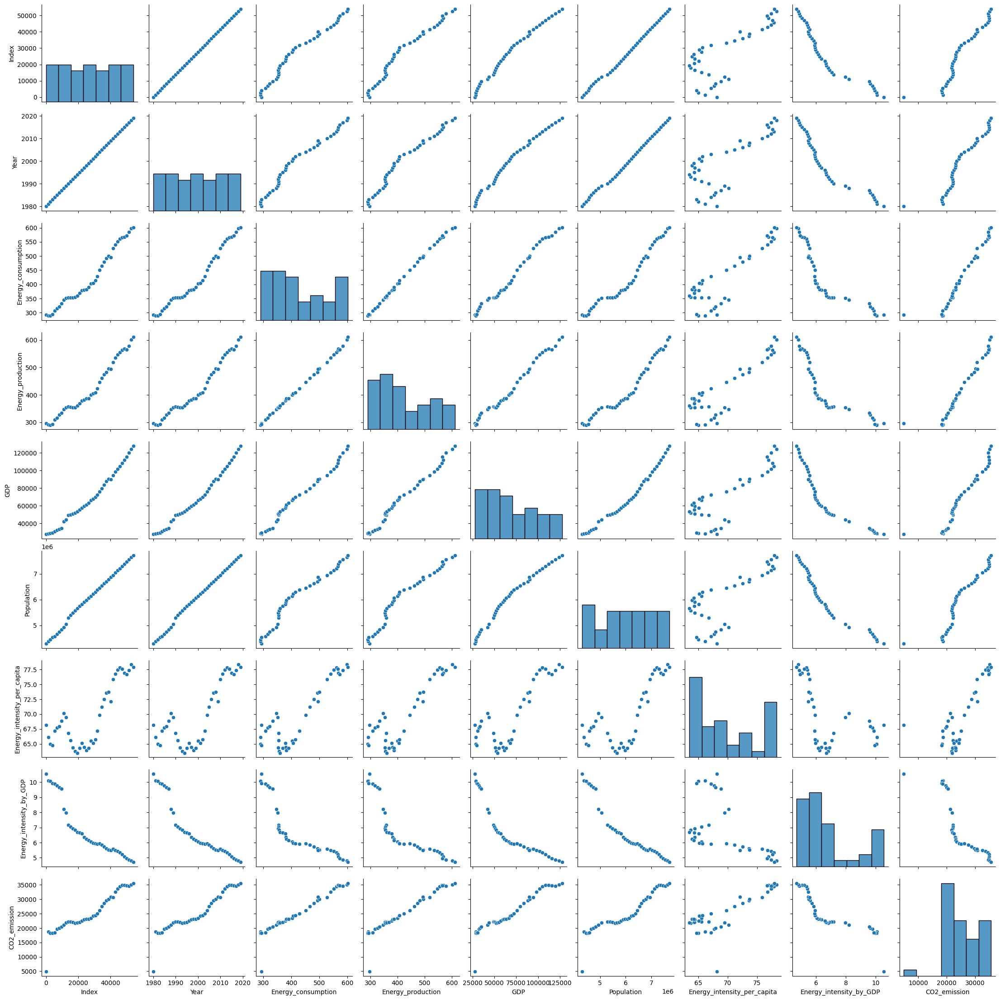

In [199]:
sns.pairplot(data =df_co2_final)

In [246]:
df_co2_final.head()

,Index,Country,Energy_type,Year,Energy_consumption,Energy_production,GDP,Population,Energy_intensity_per_capita,Energy_intensity_by_GDP,CO2_emission
7,7,Afghanistan,coal,1980,0.002479,0.002355,0.0,13356.5,1.990283,0.0,0.0
8,8,Afghanistan,natural_gas,1980,0.002094,0.062820,0.0,13356.5,1.990283,0.0,0.0
9,9,Afghanistan,petroleum_n_other_liquids,1980,0.014624,0.000000,0.0,13356.5,1.990283,0.0,0.0
10,10,Afghanistan,nuclear,1980,0.000000,0.000000,0.0,13356.5,1.990283,0.0,0.0
11,11,Afghanistan,renewables_n_other,1980,0.007386,0.007386,0.0,13356.5,1.990283,0.0,0.0


In [247]:
# Reparto de datos en train y test
# ==============================================================================
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
                                        df_co2_final.drop('CO2_emission', axis = 'columns'),
                                        df_co2_final['CO2_emission'],
                                        train_size   = 0.6,
                                        random_state = 1234,
                                        shuffle      = True
                                    )

In [248]:
print("Partición de entrenamento")
print("-----------------------")
display(y_train.describe())
display(X_train.describe())
display(X_train.describe(include = 'object'))
print(" ")

print("Partición de test")
print("-----------------------")
display(y_test.describe())
display(X_test.describe())
display(X_test.describe(include = 'object'))

Partición de entrenamento
-----------------------


count    27600.000000
mean        21.909132
std        183.568371
min         -0.000138
25%          0.000000
50%          0.000000
75%          1.118245
max       8939.781470
Name: CO2_emission, dtype: float64

,Index,Year,Energy_consumption,Energy_production,GDP,Population,Energy_intensity_per_capita,Energy_intensity_by_GDP
count,27600.000000,27600.000000,27600.000000,2.760000e+04,27600.000000,2.760000e+04,27600.000000,27600.000000
mean,27696.107935,1999.481413,0.373765,3.661872e-01,299.056612,2.653215e+04,65.145397,3.321526
std,15989.296201,11.532675,2.399172,2.304147e+00,1266.639452,1.160256e+05,110.471911,4.358362
min,7.000000,1980.000000,-0.163438,-1.000000e-39,0.000000,0.000000e+00,0.000000,0.000000
25%,13844.750000,1989.000000,0.000000,0.000000e+00,0.000000,1.558200e+02,1.800182,0.000000
50%,27694.500000,1999.000000,0.000305,0.000000e+00,14.998500,3.756710e+03,20.542583,2.614188
75%,41545.250000,2009.000000,0.063569,1.642252e-02,125.668000,1.491319e+04,85.266634,4.647514
max,55438.000000,2019.000000,94.499853,8.786290e+01,23128.340000,1.434512e+06,1139.320598,166.913605


,Country,Energy_type
count,27600,27600
unique,230,5
top,Maldives,petroleum_n_other_liquids
freq,140,5575


 
Partición de test
-----------------------


count    18400.000000
mean        22.397000
std        191.996200
min         -0.005130
25%          0.000000
50%          0.000000
75%          1.000000
max       9113.558191
Name: CO2_emission, dtype: float64

,Index,Year,Energy_consumption,Energy_production,GDP,Population,Energy_intensity_per_capita,Energy_intensity_by_GDP
count,18400.000000,18400.000000,18400.000000,1.840000e+04,18400.000000,1.840000e+04,18400.000000,18400.000000
mean,27763.338098,1999.527880,0.365070,3.730256e-01,296.025779,2.502187e+04,65.504058,3.371294
std,16027.079996,11.560031,2.369314,2.358693e+00,1209.438075,1.074986e+05,110.788229,4.718531
min,11.000000,1980.000000,-0.137971,-1.000000e-39,0.000000,0.000000e+00,0.000000,0.000000
25%,13894.500000,1990.000000,0.000000,0.000000e+00,0.000000,1.597303e+02,1.649292,0.000000
50%,27795.000000,2000.000000,0.000305,0.000000e+00,15.622750,3.812438e+03,20.198047,2.624180
75%,41651.750000,2010.000000,0.064890,1.841041e-02,129.445500,1.496210e+04,85.609530,4.691621
max,55439.000000,2019.000000,96.118714,8.851309e+01,21822.110000,1.428392e+06,1127.238553,166.913605


,Country,Energy_type
count,18400,18400
unique,230,5
top,Equatorial Guinea,natural_gas
freq,97,3706


In [249]:
# Selección de las variables por típo
# ==============================================================================
# Se estandarizan las columnas numéricas y se hace one-hot-encoding de las 
# columnas cualitativas. Para mantener las columnas a las que no se les aplica 
# ninguna transformación se tiene que indicar remainder='passthrough'.

# Identificación de columnas numéricas y categóricas
numeric_cols = X_train.select_dtypes(include=['float64', 'int']).columns.to_list()
cat_cols = X_train.select_dtypes(include=['object', 'category']).columns.to_list()


# Transformaciones para las variables numéricas
numeric_transformer = Pipeline(
                        steps=[('scaler', StandardScaler())]
                      )

# Transformaciones para las variables categóricas
categorical_transformer = Pipeline(
                            steps=[('onehot', OneHotEncoder(handle_unknown='ignore'))]
                          )

preprocessor = ColumnTransformer(
                    transformers=[
                        ('numeric', numeric_transformer, numeric_cols),
                        ('cat', categorical_transformer, cat_cols)
                    ],
                    remainder='passthrough'
                )

In [250]:
set_config(display='diagram')
preprocessor

ColumnTransformer(remainder='passthrough',
                  transformers=[('numeric',
                                 Pipeline(steps=[('scaler', StandardScaler())]),
                                 ['Index', 'Year', 'Energy_consumption',
                                  'Energy_production', 'GDP', 'Population',
                                  'Energy_intensity_per_capita',
                                  'Energy_intensity_by_GDP']),
                                ('cat',
                                 Pipeline(steps=[('onehot',
                                                  OneHotEncoder(handle_unknown='ignore'))]),
                                 ['Country', 'Energy_type'])])

In [251]:
set_config(display='text')

In [252]:
# Se aprenden y aplican las transformaciones de preprocesado
# ==============================================================================
X_train_prep = preprocessor.fit_transform(X_train)
X_test_prep  = preprocessor.transform(X_test)

In [258]:
# Convertir el output en dataframe y añadir el nombre de las columnas
# ==============================================================================
encoded_cat = preprocessor.named_transformers_['cat']['onehot']\
              .get_feature_names(cat_cols)
labels = np.concatenate([numeric_cols, encoded_cat])
datos_train_prep = preprocessor.transform(X_train)

In [268]:
encoded_cat.shape

(235,)

In [269]:
datos_train_prep = pd.DataFrame(datos_train_prep, columns=labels)
datos_train_prep.info()

ValueError: Shape of passed values is (27600, 1), indices imply (27600, 243)

In [270]:
# Pipeline de preprocedado y modelado
# ==============================================================================

# Identificación de columnas numéricas y categóricas
numeric_cols = X_train.select_dtypes(include=['float64', 'int']).columns.to_list()
cat_cols = X_train.select_dtypes(include=['object', 'category']).columns.to_list()


# Transformaciones para las variables numéricas
numeric_transformer = Pipeline(
                        steps=[('scaler', StandardScaler())]
                      )

# Transformaciones para las variables categóricas
categorical_transformer = Pipeline(
                            steps=[('onehot', OneHotEncoder(handle_unknown='ignore'))]
                          )

preprocessor = ColumnTransformer(
                    transformers=[
                        ('numeric', numeric_transformer, numeric_cols),
                        ('cat', categorical_transformer, cat_cols)
                    ],
                    remainder='passthrough'
                )

# Se combinan los pasos de preprocesado y el modelo en un mismo pipeline
pipe = Pipeline([('preprocessing', preprocessor),
                 ('modelo', MLPRegressor(solver = 'lbfgs', max_iter= 1000))])

In [271]:
# Espacio de búsqueda de cada hiperparámetro
# ==============================================================================
param_distributions = {
    'modelo__hidden_layer_sizes': [(10), (20), (10, 10)],
    'modelo__alpha': np.logspace(-3, 3, 10),
    'modelo__learning_rate_init': [0.001, 0.01],
}

# Búsqueda por validación cruzada
# ==============================================================================
grid = RandomizedSearchCV(
        estimator  = pipe,
        param_distributions = param_distributions,
        n_iter     = 50,
        scoring    = 'neg_mean_squared_error',
        n_jobs     = multiprocessing.cpu_count() - 1,
        cv         = 5, 
        verbose    = 0,
        random_state = 123,
        return_train_score = True
       )

grid.fit(X = X_train, y = y_train)

# Resultados del grid
# ==============================================================================
resultados = pd.DataFrame(grid.cv_results_)
resultados.filter(regex = '(param.*|mean_t|std_t)')\
    .drop(columns = 'params')\
    .sort_values('mean_test_score', ascending = False)\
    .head(10)

,param_modelo__learning_rate_init,param_modelo__hidden_layer_sizes,param_modelo__alpha,mean_test_score,std_test_score,mean_train_score,std_train_score
33,0.01,"(10, 10)",2.154435,-327.047314,163.038196,-139.743204,40.436989
36,0.001,"(10, 10)",1000.0,-340.369780,110.649519,-169.945408,34.921479
44,0.01,10,0.464159,-342.682462,125.918087,-192.976935,58.689615
5,0.001,"(10, 10)",215.443469,-343.233408,144.367962,-173.209876,63.521086
25,0.01,10,0.001,-353.377662,147.099726,-220.744561,57.979519
27,0.001,20,215.443469,-357.842569,138.773579,-180.099901,23.723706
21,0.001,20,46.415888,-358.045069,127.270066,-197.174532,32.557320
23,0.01,20,215.443469,-360.390386,123.320434,-176.861887,27.338290
15,0.001,10,0.001,-360.682421,151.844822,-205.058439,32.709049
13,0.01,"(10, 10)",0.1,-361.612202,124.150172,-179.622438,47.706985


In [272]:
# Error de test
# ==============================================================================
modelo_final = grid.best_estimator_
predicciones = modelo_final.predict(X = X_test)
rmse = mean_squared_error(
        y_true = y_test,
        y_pred = predicciones,
        squared = False
       )
print('Error de test (rmse): ', rmse)

Error de test (rmse):  25.841675798868405


In [273]:
accuracy = r2_score(y_true=y_test,y_pred=predicciones)
print(accuracy)

0.981883275244486


In [274]:
modelo_final['modelo'].get_params()

{'activation': 'relu',
 'alpha': 2.154434690031882,
 'batch_size': 'auto',
 'beta_1': 0.9,
 'beta_2': 0.999,
 'early_stopping': False,
 'epsilon': 1e-08,
 'hidden_layer_sizes': (10, 10),
 'learning_rate': 'constant',
 'learning_rate_init': 0.01,
 'max_fun': 15000,
 'max_iter': 1000,
 'momentum': 0.9,
 'n_iter_no_change': 10,
 'nesterovs_momentum': True,
 'power_t': 0.5,
 'random_state': None,
 'shuffle': True,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': False,
 'warm_start': False}

In [275]:
modelo_final

Pipeline(steps=[('preprocessing',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('numeric',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['Index', 'Year',
                                                   'Energy_consumption',
                                                   'Energy_production', 'GDP',
                                                   'Population',
                                                   'Energy_intensity_per_capita',
                                                   'Energy_intensity_by_GDP']),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ig

In [276]:
predicciones

array([ 1.34202392,  1.57954348, -0.2848628 , ..., -0.20530362,
        1.07374466,  1.08590194])

In [277]:
y_test

22539     0.100000
32834     0.000000
50075     0.000000
10933     0.000000
2872      0.000000
           ...    
47639     0.000000
23971    19.440349
25462     0.000000
20360     0.000000
26906     0.000000
Name: CO2_emission, Length: 18400, dtype: float64

In [278]:
X_test

,Index,Country,Energy_type,Year,Energy_consumption,Energy_production,GDP,Population,Energy_intensity_per_capita,Energy_intensity_by_GDP
22539,22539,Equatorial Guinea,petroleum_n_other_liquids,1996,0.001720,0.033997,1.25166,515.8440,3.373539,1.390329
32834,32834,Panama,natural_gas,2003,0.000000,0.000000,41.95680,3209.0600,72.211624,5.523096
50075,50075,Bulgaria,renewables_n_other,2016,0.045574,0.067602,135.73130,7121.3300,105.834925,5.552775
10933,10933,Togo,coal,1987,0.000000,0.000000,0.00000,3471.7400,2.499719,0.000000
2872,2872,Barbados,nuclear,1982,0.000000,0.000000,0.00000,254.0780,60.664064,0.000000
...,...,...,...,...,...,...,...,...,...,...
47639,47639,Greenland,renewables_n_other,2014,0.003728,0.003728,4.74688,56.4300,0.000000,0.000000
23971,23971,Finland,coal,1997,0.178314,0.000000,167.30030,5141.7120,229.016485,7.038462
25462,25462,Greenland,nuclear,1998,0.000000,0.000000,3.02957,56.0302,0.000000,0.000000
20360,20360,Panama,natural_gas,1994,0.000000,0.000000,29.40380,2684.1200,75.485514,6.890680


<AxesSubplot:ylabel='CO2_emission'>

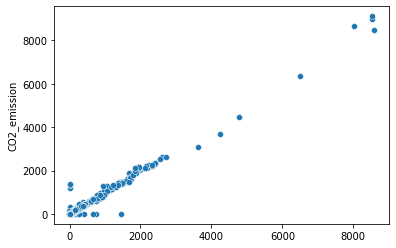

In [279]:
sns.scatterplot(x=predicciones, y=y_test)
#sns.lineplot(data=y_test)
#fig, ax = plt.subplots()
#ax= sns.lineplot(x='x', y='y', data=data)
#ax1 = sns.lineplot(x='x', y='z', data=data)

In [ ]:
# Api ejecuta query sql y devuelve un dataframe
import pandas as pd
import requests
import io

url = 'https://3wecq7h5ea.execute-api.us-east-2.amazonaws.com/prod/nn?query='



def apirequest1(query):   
    try:
       error_message = ''
    
       response = requests.get (url+query )
       if response.status_code == 200:
            df = pd.read_csv(io.BytesIO(response.content))
            return df
    
       else: 
            print(f' error:{response.status_code}')
    
    except Exception as exception:
        
        error_message = exception
        print (f'error exception: {error_message}')
    

In [ ]:
query_energy = '''SELECT "country_code" as "Country", "year", "energy_consumption", "energy_intensity_per_capita", "energy_intensity_by_gdp", "co2_emission" FROM "main_db"."energyco2" WHERE "country_code" = 'ARG';'''
'''select "country_code as Country" from  "main_db"."energyco2";'''
'''SELECT "country_code" as "Country", "year", "energy_consumption" FROM "main_db"."energyco2"'''
query03 =''' select * 
from  "main_db"."energyco2_origin";'''

In [ ]:
query_energy

In [280]:
#df_co2_com_aws = apirequest1(query03)
#df_co2_completo.head(50)
mask_AET = df_co2_completo['Energy_type']!='all_energy_types'
df_co2_AET = df_co2_completo[mask_AET]
mask_world = df_co2_AET['Country'] != 'World'
df_co2_com_aws = df_co2_AET[mask_world]

In [281]:
df_co2_com_aws.head(1)

,Unnamed: 0,Country,Energy_type,Year,Energy_consumption,Energy_production,GDP,Population,Energy_intensity_per_capita,Energy_intensity_by_GDP,CO2_emission
7,7,Afghanistan,coal,1980,0.002479,0.002355,NaN,13356.5,1.990283,0.0,NaN


In [282]:
#df_co2_com_aws.drop(['Unnamed: 0'], axis=1, inplace=True)
#df_co2_com_aws.drop(['Energy_type'], axis=1, inplace=True)
df_co2_com_aws.rename(columns={"Unnamed: 0": 'Index'},inplace=True)
df_ver_test = df_co2_com_aws['CO2_emission']
df_co2_com_aws.drop(['CO2_emission'], axis=1, inplace=True)

In [331]:

#(df3[df3.votes>200000])
df_test = df_co2_com_aws[df_co2_com_aws.Country == 'Argentina']

In [332]:
df_test.fillna(0)

,Index,Country,Energy_type,Year,Energy_consumption,Energy_production,GDP,Population,Energy_intensity_per_capita,Energy_intensity_by_GDP
49,49,Argentina,coal,1980,0.034096,0.008735,453.819,27951.93,61.286935,3.774827
50,50,Argentina,natural_gas,1980,0.368334,0.287280,453.819,27951.93,61.286935,3.774827
51,51,Argentina,petroleum_n_other_liquids,1980,1.102052,1.095156,453.819,27951.93,61.286935,3.774827
52,52,Argentina,nuclear,1980,0.025889,0.025889,453.819,27951.93,61.286935,3.774827
53,53,Argentina,renewables_n_other,1980,0.182717,0.180886,453.819,27951.93,61.286935,3.774827
...,...,...,...,...,...,...,...,...,...,...
54103,54103,Argentina,coal,2019,0.021913,0.000493,833.501,44832.70,79.083060,4.253753
54104,54104,Argentina,natural_gas,2019,1.825878,1.677434,833.501,44832.70,79.083060,4.253753
54105,54105,Argentina,petroleum_n_other_liquids,2019,1.258251,1.304009,833.501,44832.70,79.083060,4.253753
54106,54106,Argentina,nuclear,2019,0.092627,0.092627,833.501,44832.70,79.083060,4.253753


In [333]:
df_test

,Index,Country,Energy_type,Year,Energy_consumption,Energy_production,GDP,Population,Energy_intensity_per_capita,Energy_intensity_by_GDP
49,49,Argentina,coal,1980,0.034096,0.008735,453.819,27951.93,61.286935,3.774827
50,50,Argentina,natural_gas,1980,0.368334,0.287280,453.819,27951.93,61.286935,3.774827
51,51,Argentina,petroleum_n_other_liquids,1980,1.102052,1.095156,453.819,27951.93,61.286935,3.774827
52,52,Argentina,nuclear,1980,0.025889,0.025889,453.819,27951.93,61.286935,3.774827
53,53,Argentina,renewables_n_other,1980,0.182717,0.180886,453.819,27951.93,61.286935,3.774827
...,...,...,...,...,...,...,...,...,...,...
54103,54103,Argentina,coal,2019,0.021913,0.000493,833.501,44832.70,79.083060,4.253753
54104,54104,Argentina,natural_gas,2019,1.825878,1.677434,833.501,44832.70,79.083060,4.253753
54105,54105,Argentina,petroleum_n_other_liquids,2019,1.258251,1.304009,833.501,44832.70,79.083060,4.253753
54106,54106,Argentina,nuclear,2019,0.092627,0.092627,833.501,44832.70,79.083060,4.253753


In [285]:
X_test

,Index,Country,Energy_type,Year,Energy_consumption,Energy_production,GDP,Population,Energy_intensity_per_capita,Energy_intensity_by_GDP
22539,22539,Equatorial Guinea,petroleum_n_other_liquids,1996,0.001720,0.033997,1.25166,515.8440,3.373539,1.390329
32834,32834,Panama,natural_gas,2003,0.000000,0.000000,41.95680,3209.0600,72.211624,5.523096
50075,50075,Bulgaria,renewables_n_other,2016,0.045574,0.067602,135.73130,7121.3300,105.834925,5.552775
10933,10933,Togo,coal,1987,0.000000,0.000000,0.00000,3471.7400,2.499719,0.000000
2872,2872,Barbados,nuclear,1982,0.000000,0.000000,0.00000,254.0780,60.664064,0.000000
...,...,...,...,...,...,...,...,...,...,...
47639,47639,Greenland,renewables_n_other,2014,0.003728,0.003728,4.74688,56.4300,0.000000,0.000000
23971,23971,Finland,coal,1997,0.178314,0.000000,167.30030,5141.7120,229.016485,7.038462
25462,25462,Greenland,nuclear,1998,0.000000,0.000000,3.02957,56.0302,0.000000,0.000000
20360,20360,Panama,natural_gas,1994,0.000000,0.000000,29.40380,2684.1200,75.485514,6.890680


In [317]:
#filter = df_test['Index'] = 54103


In [364]:
X_new = df_test[df_test.Index == 52719]

In [426]:
#(df3[(df3.county=='Manhattan') & (df.party=='Democrat')])
year_sel = 2019
Country_sel = 'Germany'
user_sel = df_co2_com_aws[(df_co2_com_aws.Country == Country_sel) & (df_co2_com_aws.Year == year_sel)]

In [427]:
user_sel

,Index,Country,Energy_type,Year,Energy_consumption,Energy_production,GDP,Population,Energy_intensity_per_capita,Energy_intensity_by_GDP
54529,54529,Germany,coal,2019,2.243220,1.179502,4182.05,83111.4,162.83327,3.236045
54530,54530,Germany,natural_gas,2019,3.622191,0.189870,4182.05,83111.4,162.83327,3.236045
54531,54531,Germany,petroleum_n_other_liquids,2019,4.804311,0.081568,4182.05,83111.4,162.83327,3.236045
54532,54532,Germany,nuclear,2019,0.709333,0.709333,4182.05,83111.4,162.83327,3.236045
54533,54533,Germany,renewables_n_other,2019,2.154246,2.368649,4182.05,83111.4,162.83327,3.236045


In [428]:
X_new = user_sel.head(1)

In [446]:
X_new['Country'] = Country_sel
X_new['Energy_type'] = 'coal'
X_new['Population'] = 83111.4
X_new['Year'] = year_sel
X_new['Energy_consumption'] = 2.2432
X_new['GDP'] = 4182.05
X_new['Energy_intensity_per_capita'] = 162.83
X_new['Energy_intensity_by_GDP'] = 3.2360

In [435]:
X_new

,Index,Country,Energy_type,Year,Energy_consumption,Energy_production,GDP,Population,Energy_intensity_per_capita,Energy_intensity_by_GDP
54529,54529,Germany,nuclear,2019,2.2432,1.179502,4182.05,83111.4,162.83,3.236


In [447]:
predicciones_final = modelo_final.predict(X = X_new)

In [448]:
predicciones_final

array([256.25648134])

In [445]:
df_ver_test.iloc[df_ver_test.index.get_loc(54529)]

290.79839559358606

In [425]:
df_ver_test

7             NaN
8             NaN
9             NaN
10       0.000000
11       0.000000
           ...   
55435    4.586869
55436    0.000000
55437    4.377890
55438    0.000000
55439    0.000000
Name: CO2_emission, Length: 46000, dtype: float64

In [290]:
import joblib

In [291]:
modelo_final

Pipeline(steps=[('preprocessing',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('numeric',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['Index', 'Year',
                                                   'Energy_consumption',
                                                   'Energy_production', 'GDP',
                                                   'Population',
                                                   'Energy_intensity_per_capita',
                                                   'Energy_intensity_by_GDP']),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ig

In [292]:
joblib.dump(modelo_final, 'modelo_entrenado.pkl')

['modelo_entrenado.pkl']

In [293]:
modelo_final_bkp = joblib.load('modelo_entrenado.pkl')

In [297]:
predicciones_final_bkp = modelo_final.predict(X = X_new)

In [298]:
predicciones_final_bkp

array([-0.53018119])